# Embeddings and Clustering

In [1]:
%%capture
!pip install ipypublish

In [2]:
%pylab inline
import pandas as pd
import os
from ipypublish import nb_setup
# %load_ext rpy2.ipython

Populating the interactive namespace from numpy and matplotlib


In [3]:
# from google.colab import drive
# drive.mount('/content/drive')  # Add My Drive/<>

# import os
# os.chdir('drive/My Drive')
# os.chdir('Teaching/NLP')

## Word2Vec: Word Embeddings

In a number of Natural Language Processing (NLP) applications
classic methods for language modeling that represent words as high-dimensional,
sparse vectors have been replaced by Neural Language
models that learn word embeddings, i.e., low-dimensional representations
of words, often through the use of neural networks.

- https://en.wikipedia.org/wiki/Word2vec

- https://rare-technologies.com/word2vec-tutorial/

- https://machinelearningmastery.com/develop-word-embeddings-python-gensim/

- Google's word2vec page: https://code.google.com/archive/p/word2vec/

- Original word2vec paper: https://arxiv.org/pdf/1301.3781.pdf; and the improved skip-gram model: https://arxiv.org/pdf/1310.4546.pdf

- A simple exposition: https://skymind.ai/wiki/word2vec

- Word2Vec Made Easy: https://towardsdatascience.com/word2vec-made-easy-139a31a4b8ae; https://drive.google.com/file/d/1PqdcFsonU6jNu_BN7dXzcaKD-Yj56eH7/view?usp=sharing

- Word embeddings have proven to be a useful way to do meta analysis and generate new findings from extant literature as shown in [Tshitoyan et al (2019)](https://www.nature.com/articles/s41586-019-1335-8); [pdf](https://drive.google.com/file/d/19Ht2HbzDtRNPE6H2Kk2j_RQRfK8Mvnlv/view?usp=sharing). 

- The [Illustrated Word2vec](http://jalammar.github.io/illustrated-word2vec/) by Jay Alammar (this is possibly the best blog on word2vec). 


Words have multiple degrees of similarity, such as syntactic similarity and semantic similarity. Word embeddings have been found to pick up both types of similarity. These similarities have been found to support algebraic operations on words, as in the famous word2vec example where vector("Man") + vector("King") - vector("Queen") equals vector("Woman"). 

- Semantics = the study of meaning 
- Syntactic = rules of writing

The output of word2vec is an input to many natural language models using deep learning, such as sentence completion, parsing, information retrieval, document classification, question answering, and named entity recognition. 

## What is an "embedding"? 

- Think of embeddings as factor analysis for words. 

- So if we take a large number of companies and analyze their 10K/Q filings, and want to view them in the light of fewer, simpler dimensions, then we "embed" the documents in a lower dimension space, i.e., we get "document embeddings." 

- The other advantage of embeddings is that we convert words/documents of different lengths and frequencies into fixed length vectors in any dimensional space that we may choose. (There is of course art and science here.)

- This is where the intuition of principal components lies, because if $N=10$, then we are saying that 10 dimensions matter and we plot documents in that smaller space. 

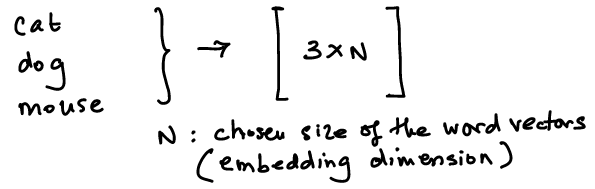

In [4]:
nb_setup.images_vconcat(["NLP_images/w2v_basic_idea.png"], width=600)

- We can also compute "semantic similarity" across documents. This may be useful in finding a diversified portfolio of companies. 

- As we have learnt before, there are 4 common ways in which we may examine similarity:
  1. Cosine similarity
  2. Jaccard similarity
  3. Minimum edit distance
  4. Simple similarity
  
- Let's look at this visualization from Jay Alammar's blog, cited above. 

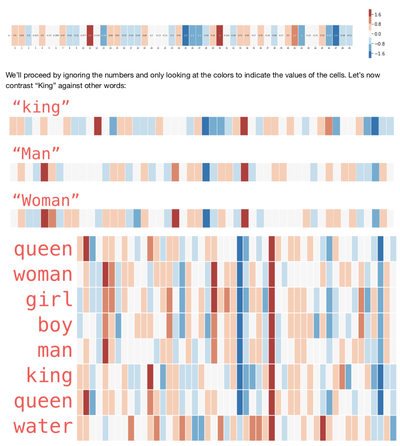

In [5]:
nb_setup.images_vconcat(["NLP_images/w2v_king_queen.png","NLP_images/w2v_kq_similar.png"], width=400)

There are two approaches to word2vec, discussed below. See: https://arxiv.org/pdf/1301.3781.pdf for the original word2vec paper. 

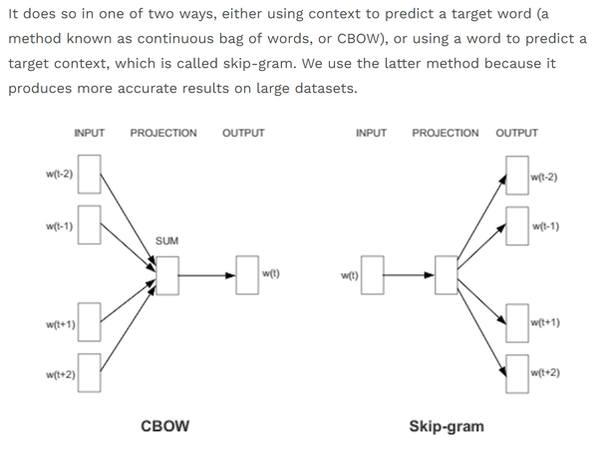

In [6]:
nb_setup.images_hconcat(["NLP_images/cbow_skipgram.png"],width=600)

## Language Models

A language model is a statistical representation of words in a language. This is easily seen in the context of a sentence completion task.

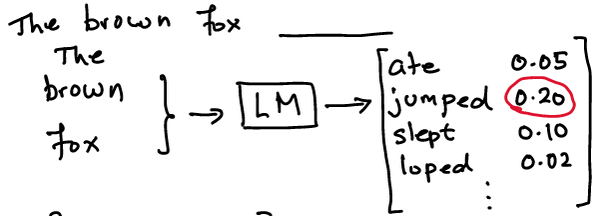

In [7]:
nb_setup.images_hconcat(["NLP_images/w2v_LM1.png"],width=600)

And word2vec is about using language modeling to get a vector representation of a word. 

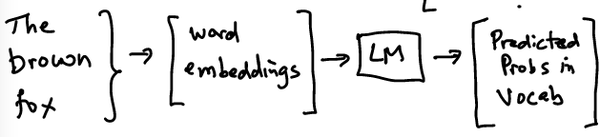

In [8]:
nb_setup.images_hconcat(["NLP_images/w2v_LM2.png"],width=600)

Let's take an example sentence. We assume that the language model uses a sequence length of 2 words. This is also called the "window length". 

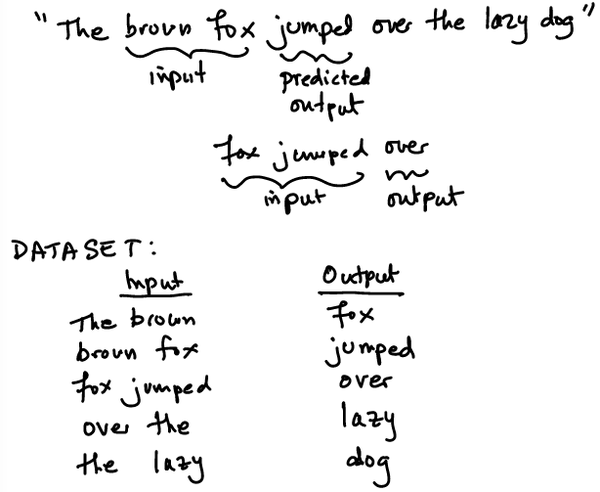

In [9]:
nb_setup.images_hconcat(["NLP_images/w2v_example-sentence.png"],width=600)

## CBOW

To get better context, we may also choose to use 2 words before and after, i.e., surrounding words. The structure would then be 

"The brown fox ___________ over the ..."

The CBOW dataset would be as follows.

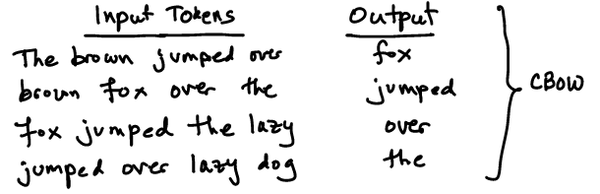

In [10]:
nb_setup.images_hconcat(["NLP_images/w2v_CBOW.png"],width=600)

## Skip-gram

The skip-gram model re-arranged the input and output as follows. 

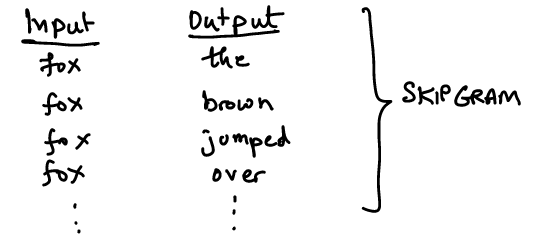

In [11]:
nb_setup.images_hconcat(["NLP_images/w2v_skipgram.png"],width=600)

## Train a language model

We use this skip-gram dataset to train a model that best predicts the neighboring word. 

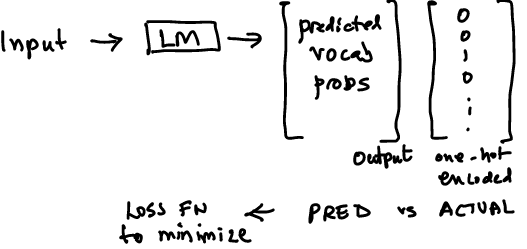

In [12]:
nb_setup.images_hconcat(["NLP_images/w2v_LM3.png"],width=600)

## Negative Sampling

Getting word embeddings requires a change in the structure of the dataset for skip-grams. 

Instead of matching inputs to outputs, we take both inputs and outputs and generate the probability that they are neighbors using word embeddings. 

Start with random embeddings and then iterate to find embeddings that match how close the word vectors are if they are neghbors or not. 

We also need to employ **negative sampling**. This could be based on uni-grams or bi-grams. 

It also makes sense to remove stopwords (sub-sampling) as they appear in the context of all words, and this also reduces the size of the vocab making computation faster. 

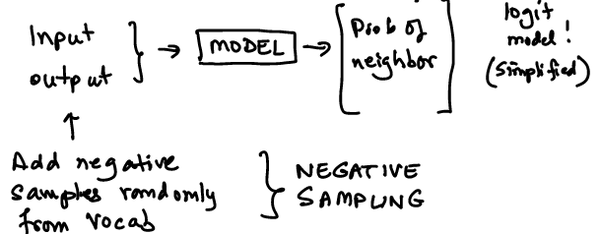

In [13]:
nb_setup.images_hconcat(["NLP_images/w2v_negative_sampling.png"],width=600)

## Pre-training Word Embeddings

- Randomly initialize "embeddings" matrix. 
- Make a copy, the "context" matrix. 
- Get the input embeddings from the embeddings matrix and the output embeddings from the context matrix. 
- For each word in the embedding matrix and its corresponding sample (true and false neighbors), compute sigmoid similarity. 
- Compare to the one-hot encoded target to get the loss function values and iteratively adjust embeddings in the context to get the new embeddings set.
- Update embeddings matrix and context matrix, rinse, repeat. 

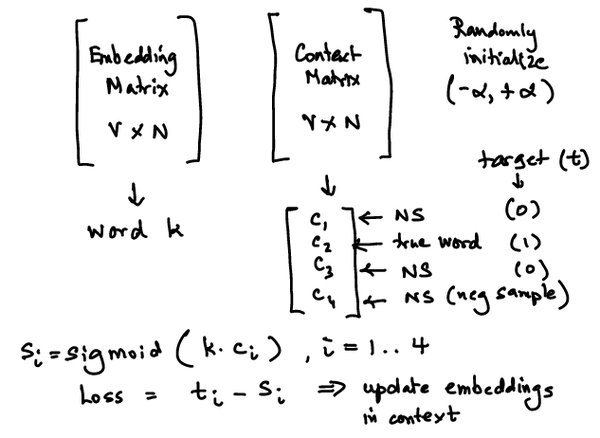

In [14]:
nb_setup.images_hconcat(["NLP_images/w2v_pretrain.png"],width=600)

As you might imagine, you have to make choices about

1. Window size ($c$)
2. Embedding dimension ($N$)

A simple blog that gives a visual feel:

- http://mccormickml.com/2016/04/19/word2vec-tutorial-the-skip-gram-model/
- http://mccormickml.com/2017/01/11/word2vec-tutorial-part-2-negative-sampling/

You can download word vectors for many languages from https://fasttext.cc/docs/en/crawl-vectors.html

## Skip-gram math

Given a sequence of words $w_1,...,w_T$ (i.e., $T$ terms), the quantity of interest in the skip-gram model is the conditional probability:

$$
p(w_{t+j} | w_t), \quad -c ≤ j ≤ c, j ≠ 0
$$

Here $c$ is a window around the current word $w_t$ in the text, and $c$ may also be a function of $w_t$. This is what is depicted in the graphic above. The objective function is to maximize the log conditional probability:

$$
L = \frac{1}{T} \sum_{t=1}^T \left[\sum_{-c ≤ j ≤ c, j ≠ 0} \log p(w_{t+j} | w_t) \right] 
$$

Assume a vocabulary of $W$ words. Let each word $w$ be represented by a word vector $v(w)$ of dimension $N$. Then the skip-gram model assumes that the conditional probabilities come from a softmax function as follows:

$$
    p(w_j | w_i) = \frac{\exp(v(w_j)^⊤ · v(w_i))}{\sum_{w=1}^W \exp(v(w)^⊤ · v(w_i))}
$$

It requires gradients for each element of the vectors $v(w)$, which is onerous and is of order $O(W)$. Instead of softmax, *hierarchical softmax* is used, which is of order $O(log W)$. An alternative is *negative sampling*, specifically Noise Contrastive Estimation (NCE) as this approximates softmax with logistic functions. Explanation of these approximations and speedups is beyond the scope of these notes, but the reader is referred to [Mikolov et al (2013)](https://arxiv.org/pdf/1310.4546.pdf), or see this [simpler exposition](https://drive.google.com/file/d/0B6YvI7JVO7hjSjZCOFZoOUw5Nm8/view?usp=sharing). 

Training is done with neural nets containing a single hidden layer of dimension $N$. The input and output layers are of the same size, and this is your essential autoencoder. 

## GloVe (Global Vectors)

A matrix factorization representation of word2vec from Stanford is called [GloVe](https://nlp.stanford.edu/projects/glove/). This is unsupervised learning. I highly recommend reading the web page, it is one of the most beautiful and succint presentations of an algorithmic idea I have encountered. 

This is not the first matrix factorization idea, Latent Semantic Analysis (LSA) has been around for some time. LSA factorizes a term-document matrix into lower dimension. But it has its drawbacks and does poorly on word analogy tasks, for which word2vec does much better. GloVe is an approach that marries the ideas in LSA and word2vec in a computationally efficient manner. 

As usual, the output from a word embedding model is an embedding matrix $E$ of size $V × N$, where $V$ is the size of the vocabulary (number of words) and $N$ is the dimension of the embedding. 

GloVe is based on the co-occurrence matrix of words $X$ of size $V × V$. This matrix depends on the "window" chosen for co-occurrence. The matrix values are also scaled depending on the closeness within the window, resulting in all values in the matrix in $(0,1)$. This matrix is then factorized to get the embedding matrix $E$. This is an extremely high-level sketch of the GloVe algorithm. See [Jeffrey Pennington, Richard Socher, and Christopher D. Manning (2014)](https://nlp.stanford.edu/pubs/glove.pdf); [pdf](https://drive.google.com/file/d/14pqAazsZ4QXYXmBCz0K_Y7pnDnh_Cwt1/view?usp=sharing).  

Technically, GloVe is faster than word2vec, but requires more memory. Also, once the word co-occurrence matrix has been prepared, then $E$ can be quickly generated for any chosen $N$, whereas in word2vec, an entirely fresh neural net has to be estimated, because the hidden layer of the autoencoder has changed in dimension. 

For large text corpora, one can intuitively imagine that word embeddings should be roughly similar if the texts are from the same domain. This suggests that pre-trained embeddings $E$ might be a good way to go for NLP applications. 

Given the word co-occurrence matrix $X$, let $X_k = \sum_i X_{ik}$ be the number of times words occur in the context of word $k$. We can then define the conditional probability, also known as co-occurrence probabilities. 

$$
P_{ik} = P(i | k) = \frac{X_{ik}}{X_k}
$$

What's the difference between a word co-occurring and a word appearing "in the context of" another word? In the context of is represented by a conditional probability, whereas co-occurence is similar to a correlation. 

For a sample word $k$, the ratio $P_{ik}/P_{jk}$ will be large if word $i$ occurs more in the context of $k$ than does word $j$. If both words $i$ and $j$ are not related to word $k$, then we'd expect this ratio to be close to 1. This suggests that the variable we should model is the ratio of co-occurrence probabilities rather than the probabilities themselves. Since these ratios are functions of three words, we may write 
$$
F(w_i,w_j,w_k) = \frac{P_{ik}}{P_{jk}}
$$
where $w_i, w_j, w_k ∈ {\cal R}^d$ are word vectors. 

This function may depend on a parameter set. It is desired to have the following properties:

- $F$ should be encoded in the word vector space. It may be easier to work with the form $F(w_i-w_j,w_k) = P_{ik}/P_{jk}$ instead. 

- $F$ is a scalar function and may be approximated with a neural net (nonlinear mapping) or a simpler linear mapping, i.e., if we assume that $F(\cdot)=\exp(\cdot)$, then $F$ is defined as follows:
$$
F((w_i-w_j)^⊤ · w_k) = \frac{F(w_i^⊤ · w_k)}{F(w_j^⊤ · w_k)} = \frac{P_{ik}}{P_{jk}} = \frac{X_{ik}/X_k}{X_{jk}/X_k}
$$
which follows from the choice of $F$ as an exponential function. 

- It also follows that 
$$
w_i^⊤ · w_k = log(P_{ik}) = log(X_{ik}) - log(X_k)
$$
This implies that the entries in the co-occurrence matrix $X$ are related to the word vectors $w$, and that too, globally, hence the "GloVe" nomenclature. 

The factorization is implemented using a least-squares fitting procedure (see the paper for details). Because the main element of the computations is a dot product, $w_i^⊤ · w_k$ and there is a similar dot product in the softmax of word2vec, it is not surprising that these models are analogous. 

- Similar factorizations occur in recommendation engines where non-negative matrix factorization (NMF) is undertaken. 

The embeddings idea may be extend to many other cases where co-occurrences exist. For example, user search histories over AirBnB in a search session may be converted into embeddings, see [Grbovic and Cheng (2018)](https://www.kdd.org/kdd2018/accepted-papers/view/real-time-personalization-using-embeddings-for-search-ranking-at-airbnb); [pdf](https://drive.google.com/file/d/16LkdzoYgVmNT28urqVxW1y_Esg7377QG/view?usp=sharing). 

## word2vec fitting with neural nets

We are now ready to discuss the actual fitting of the word2vec model with neural nets. The neural net is simple. As before assume that the vocabulary is of size $V$ and the embedding is of size $N$. To make things more concrete, let $V=10,000$ and $N=100$. The neural net will have $V$ nodes in the input and output layers, and $N$ nodes in the single hidden layer. If you are familiar with autoencoders, then this is a common NN of that type. The number of parameters (ignoring a bias term) in the NN are $VN = 1,000,000$ for the hidden layer, and, for the output layer (with a bias term), $NV=1,000,100$, i.e., over 2 million parameters to be fit. This is a fairly large NN. 

The inputs to the model are based on a window of text around the "target" word, $w$. Suppose the window is of size $c=2$, then $w$ may have up to 4 possible co-occurrence words---2 ahead (denoted $w_1, w_2$) and 2 before (denoted $w_{-1},w_{-2}$) in the window. This leads to 4 rows of input data. How? The input $X$ in all 4 rows is a one-hot vector of $(V-1)$ zeros and a single 1 in the position indexed by $w$. The label $Y$ is a one-hot vector with $V-1$ zeros and a 1 in the position where the leading or lagging word appears. Because a large corpus will have several words, each with up to $2c$ co-occurrence words, the size of the data may also run into the millions or even billions. 

The coefficient matrix for the hidden layer is of dimension $V × N$---that is, for every word in the vocabulary, we have a $N$-vector representing it. This indeed, is the entire matrix of word embeddings. Just as an autoencoder compresses the original input, in this case, the neural net projects all the words onto a $N$-dimensional space. We are interested here in the weights matrix of the hidden layer, not the predicted output itself. 

However, fitting this NN is no easy task, with millions of parameters, and possibly, billions of observations of data. To reduce the computational load, two simple additional techniques (hacks) are applied. 

1. *Subsampling*: We get rid of words that occur too frequently. So we only keep a subsample of words that occur less often. There is a formula for this. Let $\gamma(w)$ be the percentage of word count for $w$ among all words. This is likely to be a small number. We then sort the words based on a function of $\gamma(w)$ and put in a cutoff, where only words with smaller $\gamma(w)$ are retained. This eliminates common words like "the" and "this" and reduces computation time without much impact on the final word embeddings. 

2. *Negative sampling*: NNs are usually fitted in batches. In each batch of data all the weights (parameters) are updated. This can be quite costly in computation. In the hidden layer, this would mean updating all $VN=1$ million weights in the hidden layer. Instead, we only update the target word $w$ and 5-10 words that do not co-occur with $w$. We call these words "negatives" and hence the terminology of negative sampling. Negative words are sampled with a probability that is higher if they occur more frequently in the sample. 

Both these approaches work well and have resulted in great speed up in fitting the word2vec model. [pdf](https://drive.google.com/file/d/12x9Q1AspyPvb-VTpVtPNq2HY1MjXygJ7/view?usp=sharing)

# Big Data: Reuters News Corpus

https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/packages/corpora/reuters.zip

The Reuters-21578 benchmark corpus, ApteMod 

id: reuters; size: 6378691; author: ; copyright: ; license: The copyright for the text of newswire articles and Reuters annotations in the Reuters-21578 collection resides with Reuters Ltd. Reuters Ltd. and Carnegie Group, Inc. have agreed to allow the free distribution of this data *for research purposes only*. If you publish results based on this data set, please acknowledge its use, refer to the data set by the name 'Reuters-21578, Distribution 1.0', and inform your readers of the current location of the data set.;

https://pynlp.wordpress.com/2013/12/10/unit-5-part-ii-working-with-files-ii-the-plain-text-corpus-reader-of-nltk/

In [15]:
# Read in text cleaning functions
%run Text_Cleaning_Functions.ipynb

[nltk_data] Downloading package punkt to /home/ec2-user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [16]:
#Read in the corpus
import nltk
from nltk.corpus import PlaintextCorpusReader
corpus_root = 'NLP_data/reuters/training/'
ctext = PlaintextCorpusReader(corpus_root, '.*')

In [17]:
%%time
#How many docs, paragraphs, sentences, words, characters? 
print(len(ctext.fileids()))
print(len(ctext.paras()))
print(len(ctext.sents()))
print(len(ctext.words()))
print(len(ctext.raw()))

7769
8471
40277
1253696
6478471
CPU times: user 7.76 s, sys: 548 ms, total: 8.31 s
Wall time: 8.3 s


In [18]:
#Convert corpus to text array with a full string for each doc
def merge_arrays(word_lists):
    wordlist = []
    for wl in word_lists:
        wordlist = wordlist + wl
    doc = ' '.join(wordlist)
    return doc

In [19]:
#Run this through the corpus to get a word array for each doc
text_array = []
for p in ctext.paras():
    doc = merge_arrays(p)
    text_array.append(doc)

In [20]:
#Show the array sample
print(len(text_array))
text_array[:2]

8471


['BAHIA COCOA REVIEW Showers continued throughout the week in the Bahia cocoa zone , alleviating the drought since early January and improving prospects for the coming temporao , although normal humidity levels have not been restored , Comissaria Smith said in its weekly review . The dry period means the temporao will be late this year . Arrivals for the week ended February 22 were 155 , 221 bags of 60 kilos making a cumulative total for the season of 5 . 93 mln against 5 . 81 at the same stage last year . Again it seems that cocoa delivered earlier on consignment was included in the arrivals figures . Comissaria Smith said there is still some doubt as to how much old crop cocoa is still available as harvesting has practically come to an end . With total Bahia crop estimates around 6 . 4 mln bags and sales standing at almost 6 . 2 mln there are a few hundred thousand bags still in the hands of farmers , middlemen , exporters and processors . There are doubts as to how much of this coco

In [21]:
#Clean up the docs using the previous functions
news = text_array
news = removePunc(news)
news = removeNumbers(news)
news = stopText(news)
#news = stemText(news)
news = [j.lower() for j in news]
news[:10]

[' bahia cocoa review showers continued throughout week bahia cocoa zone alleviating drought since early january improving prospects coming temporao although normal humidity levels restored comissaria smith said weekly review the dry period means temporao late year arrivals week ended february bags kilos making cumulative total season mln stage last year again seems cocoa delivered earlier consignment included arrivals figures comissaria smith said still doubt much old crop cocoa still available harvesting practically come end with total bahia crop estimates around mln bags sales standing almost mln hundred thousand bags still hands farmers middlemen exporters processors there doubts much cocoa would fit export shippers experiencing dificulties obtaining bahia superior certificates in view lower quality recent weeks farmers sold good part cocoa held consignment comissaria smith said spot bean prices rose cruzados per arroba kilos bean shippers reluctant offer nearby shipment limited sa

In [22]:
#Make it into a TFIDF matrix
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(text_array)
tfs = tfidf.fit_transform(text_array)
tdm_mat = tfs.toarray().T
print(tdm_mat.shape)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(26283, 8471)


In [23]:
#Create plain TDM
from sklearn.feature_extraction.text import CountVectorizer

docs = news
vec = CountVectorizer()
X = vec.fit_transform(docs)
df = pd.DataFrame(X.toarray(), columns=vec.get_feature_names())
tdm = df.T
tdm.shape

(24670, 8471)

In [24]:
x1 = randint(tdm.shape[0]+1)
y1 = randint(tdm.shape[1]+1)
tdm.iloc[x1:x1+20,y1:y1+20]

,3509,3510,3511,3512,3513,3514,3515,3516,3517,3518,3519,3520,3521,3522,3523,3524,3525,3526,3527,3528
tubular,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tuccillo,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tucker,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tucson,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tucsonm,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tues,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tuesday,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tug,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tugs,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
tuition,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [25]:
%%capture
!pip install gensim

In [26]:
%%capture
import gensim, logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [27]:
print(len(news))
news[:3]

8471


[' bahia cocoa review showers continued throughout week bahia cocoa zone alleviating drought since early january improving prospects coming temporao although normal humidity levels restored comissaria smith said weekly review the dry period means temporao late year arrivals week ended february bags kilos making cumulative total season mln stage last year again seems cocoa delivered earlier consignment included arrivals figures comissaria smith said still doubt much old crop cocoa still available harvesting practically come end with total bahia crop estimates around mln bags sales standing almost mln hundred thousand bags still hands farmers middlemen exporters processors there doubts much cocoa would fit export shippers experiencing dificulties obtaining bahia superior certificates in view lower quality recent weeks farmers sold good part cocoa held consignment comissaria smith said spot bean prices rose cruzados per arroba kilos bean shippers reluctant offer nearby shipment limited sa

In [28]:
#Tokenize each document
def textTokenize(text_array):
    textTokens = []
    for h in text_array:
        textTokens.append(h.split(' '))
    return textTokens

In [29]:
sentences = textTokenize(news)
print(len(sentences))
print(type(sentences))
sentences[:2]

8471
<class 'list'>


[['',
  'bahia',
  'cocoa',
  'review',
  'showers',
  'continued',
  'throughout',
  'week',
  'bahia',
  'cocoa',
  'zone',
  'alleviating',
  'drought',
  'since',
  'early',
  'january',
  'improving',
  'prospects',
  'coming',
  'temporao',
  'although',
  'normal',
  'humidity',
  'levels',
  'restored',
  'comissaria',
  'smith',
  'said',
  'weekly',
  'review',
  'the',
  'dry',
  'period',
  'means',
  'temporao',
  'late',
  'year',
  'arrivals',
  'week',
  'ended',
  'february',
  'bags',
  'kilos',
  'making',
  'cumulative',
  'total',
  'season',
  'mln',
  'stage',
  'last',
  'year',
  'again',
  'seems',
  'cocoa',
  'delivered',
  'earlier',
  'consignment',
  'included',
  'arrivals',
  'figures',
  'comissaria',
  'smith',
  'said',
  'still',
  'doubt',
  'much',
  'old',
  'crop',
  'cocoa',
  'still',
  'available',
  'harvesting',
  'practically',
  'come',
  'end',
  'with',
  'total',
  'bahia',
  'crop',
  'estimates',
  'around',
  'mln',
  'bags',
  'sal

In [30]:
#Train the model on Word2Vec
model = gensim.models.Word2Vec(sentences, min_count=1)
type(model)

gensim.models.word2vec.Word2Vec

In [31]:
model.wv['crop']

array([-0.6047522 ,  0.6634555 ,  0.43312415, -1.3144717 ,  0.4347198 ,
       -2.6033113 ,  0.22217862,  1.2982701 , -0.14712268, -0.31630015,
        0.74213445, -1.0290946 ,  0.2111963 ,  1.0779085 ,  0.9226259 ,
       -0.33691144, -0.21883576, -0.8124803 , -0.7505881 ,  0.18985623,
        0.68173826, -0.6334861 ,  0.32008928, -0.51832134,  0.14907758,
       -0.17729554,  0.4955346 ,  0.36394078, -0.56881565, -0.85841376,
        1.4588134 , -0.6703112 ,  0.9076823 , -0.5275418 ,  0.30811584,
        0.41662398,  0.7668652 , -1.286059  , -0.7187453 , -1.3139058 ,
       -0.3476992 ,  0.27598387,  0.27405828, -1.5762649 , -0.49601305,
        1.1651075 ,  0.17410244,  0.35952854, -0.9805247 , -0.37350178,
        0.03529582, -0.14291623, -0.9427583 ,  0.47139874, -0.05838028,
        0.14761494,  1.9952999 ,  0.07688446,  0.7306137 , -0.56470734,
       -1.1686332 ,  0.06580821,  0.14788762, -0.22368632, -1.3597598 ,
        1.0522622 , -0.60328585, -0.67505294, -1.1846308 ,  0.37

In [32]:
model.wv.most_similar('crop',topn=5)

[('harvest', 0.9591773152351379),
 ('season', 0.9234784245491028),
 ('winter', 0.9170418977737427),
 ('maize', 0.914795994758606),
 ('planted', 0.9139994978904724)]

In [33]:
model.wv.most_similar('billion',topn=5)

[('lire', 0.8446239829063416),
 ('balance', 0.8285969495773315),
 ('draining', 0.8127597570419312),
 ('baht', 0.811485230922699),
 ('marks', 0.8098920583724976)]

In [34]:
model.wv.similarity('sale','stock')

0.3593571

In [35]:
model.wv.most_similar('bank')

[('banks', 0.8232142925262451),
 ('bankers', 0.7304802536964417),
 ('england', 0.7264469265937805),
 ('bundesbank', 0.7119458317756653),
 ('arifin', 0.7112419605255127),
 ('staunchly', 0.7080891132354736),
 ('forceful', 0.7034879326820374),
 ('central', 0.7022360563278198),
 ('midsession', 0.7007637619972229),
 ('paper', 0.6936109066009521)]

In [36]:
model.wv.most_similar(positive=['mark', 'german'], negative=['england'], topn=1)

[('weakening', 0.792537271976471)]

In [37]:
model.wv.most_similar(positive=['mark', 'german'], negative=['french'], topn=1)

[('sterling', 0.7980971932411194)]

In [38]:
model.wv.most_similar(positive=['dollar', 'long'], negative=['mark'], topn=1)

[('likely', 0.728237509727478)]

## Using Sent2Vec

https://github.com/epfml/sent2vec

https://rare-technologies.com/sent2vec-an-unsupervised-approach-towards-learning-sentence-embeddings/

https://towardsdatascience.com/document-embedding-techniques-fed3e7a6a25d

In [39]:
%%capture
!pip install spacy
!python -m spacy download en_core_web_sm
!python -m spacy download en

In [40]:
%%capture
!pip install sent2vec
import nltk
nltk.download('punkt')
from scipy import spatial
from sent2vec.vectorizer import Vectorizer
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package punkt to /home/ec2-user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [41]:
sentences = [
    "The traveling salesman problem is a classic hard problem in computer science.",
    "The traveling salesman problem recently achieved a better solution, kudos to computer science.",
]

vectorizer = Vectorizer()
vectorizer.bert(sentences)
vectors = vectorizer.vectors
vectors.shape

(2, 768)

## Doc2Vec

This algorithm is analogous to word2vec but instead of word embeddings it generates document embeddings. Documents that are semantically similar with be closer to each other in the embedding space. 

- The original paper by Quoc Le and Tomas Mikolov is here: https://arxiv.org/abs/1405.4053; https://drive.google.com/file/d/1NBtLERtwRWy_RNVG5FKqRG-8oQTedSAz/view?usp=sharing 

- A simple blog post that offers some more explanation: https://medium.com/scaleabout/a-gentle-introduction-to-doc2vec-db3e8c0cce5e; https://drive.google.com/file/d/1GxzHpmdRac7n8wM9QqXFhmelkmBNjU8A/view?usp=sharing

Let's use the Reuters news corpus as an example. 

In [42]:
#Recreate the documents (without stemming to retain whole words)
#Clean up the docs using the previous functions
news = text_array
news = removePunc(news)
news = removeNumbers(news)
news = stopText(news)
#news = stemText(news)
news = [j.lower() for j in news]
sentences = textTokenize(news)
print(len(sentences))

8471


In [43]:
from gensim.utils import simple_preprocess
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
n_news = range(len(news))
docs = [TaggedDocument(simple_preprocess(j),[i]) for j,i in zip(news,n_news)]

In [44]:
list(docs[:2])

[TaggedDocument(words=['bahia', 'cocoa', 'review', 'showers', 'continued', 'throughout', 'week', 'bahia', 'cocoa', 'zone', 'alleviating', 'drought', 'since', 'early', 'january', 'improving', 'prospects', 'coming', 'temporao', 'although', 'normal', 'humidity', 'levels', 'restored', 'comissaria', 'smith', 'said', 'weekly', 'review', 'the', 'dry', 'period', 'means', 'temporao', 'late', 'year', 'arrivals', 'week', 'ended', 'february', 'bags', 'kilos', 'making', 'cumulative', 'total', 'season', 'mln', 'stage', 'last', 'year', 'again', 'seems', 'cocoa', 'delivered', 'earlier', 'consignment', 'included', 'arrivals', 'figures', 'comissaria', 'smith', 'said', 'still', 'doubt', 'much', 'old', 'crop', 'cocoa', 'still', 'available', 'harvesting', 'practically', 'come', 'end', 'with', 'total', 'bahia', 'crop', 'estimates', 'around', 'mln', 'bags', 'sales', 'standing', 'almost', 'mln', 'hundred', 'thousand', 'bags', 'still', 'hands', 'farmers', 'middlemen', 'exporters', 'processors', 'there', 'doubt

In [45]:
model = gensim.models.doc2vec.Doc2Vec(docs, min_count=1)
type(model)

gensim.models.doc2vec.Doc2Vec

In [46]:
#Doc vector: note here we use the original document tokens, not the tagged version
x = sentences[0]
print(x)
model.infer_vector(x)

['', 'bahia', 'cocoa', 'review', 'showers', 'continued', 'throughout', 'week', 'bahia', 'cocoa', 'zone', 'alleviating', 'drought', 'since', 'early', 'january', 'improving', 'prospects', 'coming', 'temporao', 'although', 'normal', 'humidity', 'levels', 'restored', 'comissaria', 'smith', 'said', 'weekly', 'review', 'the', 'dry', 'period', 'means', 'temporao', 'late', 'year', 'arrivals', 'week', 'ended', 'february', 'bags', 'kilos', 'making', 'cumulative', 'total', 'season', 'mln', 'stage', 'last', 'year', 'again', 'seems', 'cocoa', 'delivered', 'earlier', 'consignment', 'included', 'arrivals', 'figures', 'comissaria', 'smith', 'said', 'still', 'doubt', 'much', 'old', 'crop', 'cocoa', 'still', 'available', 'harvesting', 'practically', 'come', 'end', 'with', 'total', 'bahia', 'crop', 'estimates', 'around', 'mln', 'bags', 'sales', 'standing', 'almost', 'mln', 'hundred', 'thousand', 'bags', 'still', 'hands', 'farmers', 'middlemen', 'exporters', 'processors', 'there', 'doubts', 'much', 'cocoa

array([ 0.6374905 , -0.43022326, -0.23346013,  0.60252   ,  0.16633621,
        0.12022346,  0.2704056 ,  0.6068978 , -0.30618155, -0.44511977,
       -0.6598322 , -0.3370925 , -0.00756555,  0.34629983,  0.5116106 ,
        0.44754672,  0.5707697 ,  0.5346628 ,  0.01413362, -0.15052328,
       -0.49238846,  0.01317614, -0.09059332, -0.7995476 ,  0.5095231 ,
        0.4816434 , -1.0851634 , -1.0310527 , -0.53291196,  0.6314064 ,
        1.0663624 ,  0.16509715,  0.23093964, -0.964621  , -0.14577454,
        0.30485734,  0.03094148,  0.10110306,  0.23068553, -0.12382652,
       -0.621432  , -1.0379617 ,  0.4020333 , -0.38926002,  0.12911898,
       -0.5603667 , -0.23890683,  0.7678753 ,  0.18990913, -0.3549218 ,
        0.6028445 , -0.04873922,  0.1512538 , -0.04348582, -0.68404186,
        1.3545835 , -1.3629488 ,  0.185513  , -0.5260192 ,  0.316363  ,
        0.8089507 ,  0.19850448, -0.13749425, -0.49981567,  0.06518458,
        0.17769362,  0.3492177 ,  0.6243118 , -0.74157387,  0.59

In [47]:
# Pick any document from the test corpus and infer a vector from the model
doc_id = 0
inferred_vector = model.infer_vector(sentences[doc_id])
sims = model.docvecs.most_similar([inferred_vector], topn=len(model.docvecs))

# Compare and print the most/median/least similar documents from the train corpus
print('Test Document ({}): «{}»\n'.format(doc_id, ' '.join(sentences[doc_id])))
print(u'SIMILAR/DISSIMILAR DOCS PER MODEL %s:\n' % model)
for label, index in [('MOST', 0), ('MEDIAN', len(sims)//2), ('LEAST', len(sims) - 1)]:
    print(u'%s %s: «%s»\n' % (label, sims[index], ' '.join(docs[sims[index][0]].words)))

Test Document (0): « bahia cocoa review showers continued throughout week bahia cocoa zone alleviating drought since early january improving prospects coming temporao although normal humidity levels restored comissaria smith said weekly review the dry period means temporao late year arrivals week ended february bags kilos making cumulative total season mln stage last year again seems cocoa delivered earlier consignment included arrivals figures comissaria smith said still doubt much old crop cocoa still available harvesting practically come end with total bahia crop estimates around mln bags sales standing almost mln hundred thousand bags still hands farmers middlemen exporters processors there doubts much cocoa would fit export shippers experiencing dificulties obtaining bahia superior certificates in view lower quality recent weeks farmers sold good part cocoa held consignment comissaria smith said spot bean prices rose cruzados per arroba kilos bean shippers reluctant offer nearby s

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:4: DeprecationWarning: Call to deprecated `docvecs` (The `docvecs` property has been renamed `dv`.).


## t-SNE Plots

Here is the original t-SNE paper: https://www.jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf

Properties:

1. t-SNE is slow as the dataset gets large.
2. Distances within cluster are correct but not between cluster so it is not a clustering algorithm, it is a visualization algorithm.
3. You can use it to project down a dataset into 2 or 3 dimensions. If you get separate groups, it suggests that a multiclass classifier may do a good job. See: https://colah.github.io/posts/2014-10-Visualizing-MNIST/

SNE stands for "Stochastic Neighbor Embedding".

## t-SNE Algorithm

The basics of the algorithm are as follows, using the equations in the paper:

1. Get a Gaussian measure of similarity of two points, represented by vectors $x_i$ and $x_j$ as follows:

$$
p_{j|i} = \frac{\exp(-\|x_i-x_j\|^2/2\sigma_i^2)}{\sum_{k \neq i}\exp(-\|x_i-x_k\|^2/2\sigma_i^2)}
$$

2. $x$ is in the high-dimensional space and we are projecting into points $y_i$ and $y_j$ in the low-dimension space, so we can define a similarity metric for the low-dimension space as well. We note that the variance chosen for the low-dimension enbedding is $1/\sqrt{2}$. 

$$
q_{j|i} = \frac{\exp(-\|y_i-y_j\|^2)}{\sum_{k \neq i}\exp(-\|y_i-y_k\|^2)}, \quad q_{i|i}=0
$$

3. We want the distributions $p$ and $q$ to be as close as possible, and we define the distance between the two using the [Kullback-Leibler (KL) divergence](https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence). We call this a "cost" (loss) function and minimize this. 

$$
C = \sum_i KL(P_i \| Q_i) = \sum_i \sum_j p_{j|i} \log\frac{p_{j|i}}{q_{j|i}}
$$

Here, $P_i$ represents the conditional probability distribution over all other datapoints given datapoint $x_i$, and $Q_i$ represents the conditional probability distribution over all other map points given
map point $y_i$.

4. How to set the parameter $\sigma_i$? This is done by choosing a desired perplexity parameter and setting it equal to 

$$
Perp(P_i) = 2^{H(P_i)}, \quad H(P_i) = -\sum_j p_{j|i} log_2 p_{j|i}
$$

where $H(P_i)$ is Shannon entropy.

5. Finally, minimize the loss function by taking derivatives wrt points $y$:

$$
\frac{\partial C}{\partial y_i} = 2 \sum_j [p_{j|i}-q_{j|i}+p_{i|j}-q_{i|j}](y_i-y_j)
$$

This is the dimension of $y_i$.

Let's see the t-SNE plot on the Reuters news dataset. 

In [48]:
import nltk
from nltk.corpus import PlaintextCorpusReader
corpus_root = 'NLP_data/reuters/training/'
ctext = PlaintextCorpusReader(corpus_root, '.*')

In [49]:
#Convert corpus to text array with a full string for each doc
def merge_arrays(word_lists):
    wordlist = []
    for wl in word_lists:
        wordlist = wordlist + wl
    doc = ' '.join(wordlist)
    return doc

#Run this through the corpus to get a word array for each doc
text_array = []
for p in ctext.paras():
    doc = merge_arrays(p)
    text_array.append(doc)

df = pd.DataFrame(text_array, columns=["Text"])
df.head()

,Text
0,BAHIA COCOA REVIEW Showers continued throughou...
1,COMPUTER TERMINAL SYSTEMS & lt ; CPML > COMPLE...
2,N . Z . TRADING BANK DEPOSIT GROWTH RISES SLIG...
3,NATIONAL AMUSEMENTS AGAIN UPS VIACOM & lt ; VI...
4,ROGERS & lt ; ROG > SEES 1ST QTR NET UP SIGNIF...


In [50]:
%%capture
# Install TextHero
!pip install texthero==1.0.5
import texthero as hero

In [51]:
df['Text'] = hero.clean(df['Text'])
df.head()

,Text
0,bahia cocoa review showers continued throughou...
1,computer terminal systems lt cpml completes sa...
2,n z trading bank deposit growth rises slightly...
3,national amusements ups viacom lt via bid viac...
4,rogers lt rog sees 1st qtr net significantly r...


In [52]:
import random
news_sample = random.sample(list(df.Text),100)
news_sample

['guatemala host milds coffee meeting guatemala host meeting milds coffee producers probably may discuss basic export quotas guatemalan delegate international coffee organization ico said firm date set talks ambassador rene montes told reporters ico executive board meeting producer countries brazil colombia member oamcaf african malagasy coffee organization may also invited consultation said ico producers consumers could agree calculate export quota shares recent council meeting milds coffee producers include costa rica dominican republic ecuador el salvador guatemala honduras india mexico nicaragua papua new guinea peru',
 'publicker industries inc lt pul 4th qtr loss shr loss five cts vs loss cts net loss vs loss sales vs avg shrs mln vs mln year shr loss four cts vs loss cts net loss vs loss sales mln vs mln avg shrs mln vs mln',
 'investment firms stake mcgill mftg lt mgll group affiliated investment firms led bermuda based fidelity international ltd boston based fmr corp told secu

In [53]:
import gensim, logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

#Tokenize each document
def textTokenize(text_array):
    textTokens = []
    for h in text_array:
        textTokens.append(h.split(' '))
    return textTokens

sentences = textTokenize(news_sample)

#Train the model on Word2Vec
model = gensim.models.Word2Vec(sentences, min_count=1)

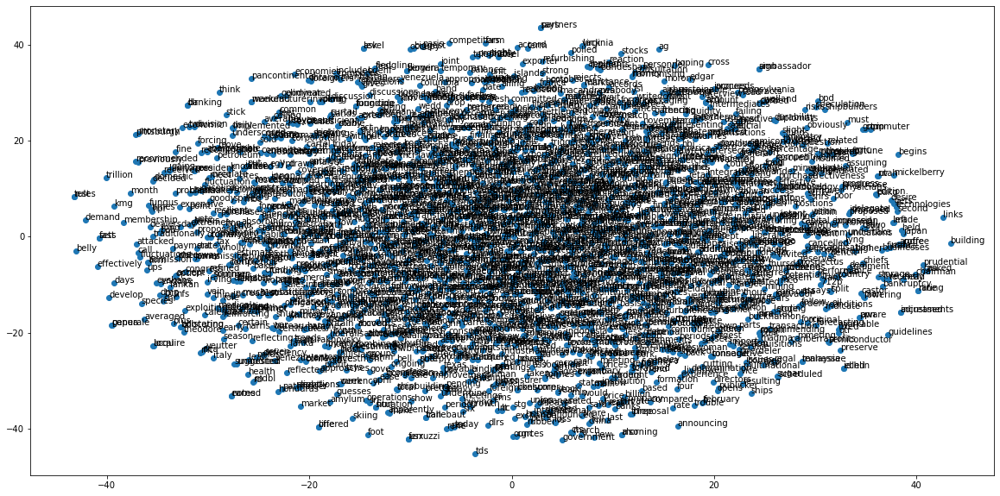

CPU times: user 43.4 s, sys: 1.39 s, total: 44.8 s
Wall time: 19.8 s


In [61]:
%%time
from sklearn.manifold import TSNE

X = model.wv[model.wv.key_to_index]
labels = model.wv.index_to_key

figure(figsize=(20,10))

tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)
x = X_tsne[:, 0]
y = X_tsne[:, 1]

scatter(x,y)
for i, txt in enumerate(labels):
    annotate(txt, (x[i], y[i]))
show()

## UMAP

Recently, there is an improvement on t-SNE, called UMAP, coming from the Biology and Life Sciences, see: https://arxiv.org/abs/1802.03426

UMAP extends to any dimensional enbedding, replaces the perplexity requirement with a nearest-neighbors one (see the top of page 15 here: https://arxiv.org/pdf/1802.03426.pdf, and is faster in run time. 

## Let's use TextHero 

https://texthero.org/

TextHero's text cleaning function does the following cleanups: 

1. Fills in empty space for `na` values
2. lowercase text
3. removes digits
4. removes punctuation
5. remove stopwords
6. removes whitespace
7. removes accents on words (also known as "diacritics")

In [62]:
import texthero as hero
df['tfidf'] = (
    hero.do_tfidf(df['Text'], max_features=100)
)
print(df.shape)
df.columns

(8471, 3)


Index(['Text', 'tfidf', 'pca'], dtype='object')

In [63]:
# Reduce dimension and visualize the vector space
df['pca'] = hero.do_pca(df['tfidf'])
hero.scatterplot(
    df, 
    col='pca', 
    title="Reuters news: PCA",
    hover_data=["Text"]
)

## RegTech

https://app.box.com/s/ar58s7z253wdgy9ceiq9w0rm7h52z4p3

## Research in Finance

https://srdas.github.io/MLBook/TextAnalytics.html#research-in-finance

- Polarity and Subjectivity: https://srdas.github.io/MLBook/TextAnalytics.html#polarity-and-subjectivity
- Tone: https://srdas.github.io/MLBook/TextAnalytics.html#tone
- Commercial Developments: https://srdas.github.io/MLBook/TextAnalytics.html#tone
- Predicting market direction with Twitter, see the controversial paper by [Bollen, Mao, Zeng (2010)](https://arxiv.org/abs/1010.3003), and a rebuttal by [Lachanski and Pav (2017)](https://journaltalk.net/articles/5947). 

## Fun Exercise 

1. Download SEC 10-K/Q filings for a set of 50 tickers for all of the last 4 quarters. 
2. Extract the MD&A section for each filing.
3. Summarize these down to 20% of their original size. 
4. Compute the similarity matrix of all firms. 
5. Cluster the firms by this similarity matrix. 
6. Plot the clusters using t-SNE. 
6. Find the top 10 firms that have the greatest changes in their filings over the last two quarters. 
7. Show these on the t-SNE plot. Discuss any patterns you may see. 